In [1]:
#import libraries from local directory 
import os
import sys
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import feedparser
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from datetime import datetime
from datetime import timedelta
import smtplib
from smtplib import SMTP_SSL as SMTP
import geopandas as gpd
import fiona
from ftplib import FTP
import shutil
from os.path import relpath
import re
import zipfile
from os.path import relpath
from os import listdir
from os.path import isfile, join
from pybufrkit.decoder import Decoder
from pybufrkit.renderer import FlatTextRenderer
from sys import platform
from io import StringIO
from bs4 import BeautifulSoup
import subprocess
import netCDF4
import bottleneck
from geopandas.tools import sjoin
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.ops import nearest_points

os.chdir("C:\\Users\\Marieke\\GitHub\\Typhoon_IBF_Rice_Damage_Model")
cdir = os.getcwd()
decoder = Decoder()

In [2]:
# Importing local libraries
sys.path.insert(
    0,
    os.path.join(cdir, "\\IBF_typhoon_model\\data\\wind_data\\climada")
)

from climada.hazard import Centroids, TropCyclone,TCTracks
from climada.hazard.tc_tracks import estimate_roci,estimate_rmw
from climada.hazard.tc_tracks_forecast import TCForecast

In [3]:
# Loads an excel sheet with Local_name, International_Name and year
file_name = "IBF_typhoon_model\\data\\wind_data\\input\\typhoon_events_test.csv"
path = os.path.join(cdir, file_name)
typhoon_events=pd.read_csv(path)

typoon_event=[]
for index, row in typhoon_events.iterrows():
    typoon_event.append(str(row['International_Name']).upper()+str(row['year']))

typhoon_events=[typhoon.upper() for typhoon in list(typhoon_events.International_Name.values)]

sel_ibtracs = TCTracks()

# correct_pres ignores tracks with not enough data. For statistics (frequency of events), these should be considered as well
# Set year range for which data should be collected
# TODO can automate this from input sheet
sel_ibtracs.read_ibtracs_netcdf(provider='usa', year_range=(2006, 2021), basin='WP', correct_pres=False)
Typhoons=TCTracks()
# Select typhoons that are in the typhoon event sheet
Typhoons.data=[tr for tr in sel_ibtracs.data if (tr.name+tr.sid[:4]) in typoon_event ]

2021-09-01 16:31:29,271 - climada.hazard.tc_tracks - WARNING - 15 storm events are discarded because no valid wind/pressure values have been found: 2006184N16110, 2007276N20147, 2008223N27151, 2009291N16111, 2009328N06108, ...


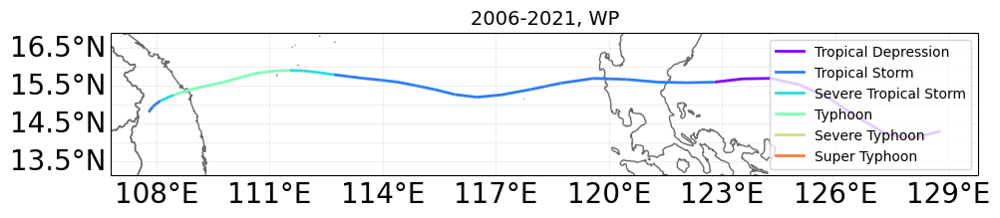

In [4]:
# Plots all tracks in time frame
# Is supposed to plot the tracks, doesn't work --> not required
ax = Typhoons.plot()
ax.get_legend()._loc = 1 # correct legend location
ax.set_title('2006-2021, WP',fontsize = 14) # set title
plt.show()
plt.close()


In [5]:
# Select names and storm id's of storms
names=[[tr.name,tr.sid] for tr in Typhoons.data]

114.27790168600006 4.587294497000073 126.60482466300004 21.12180803600006


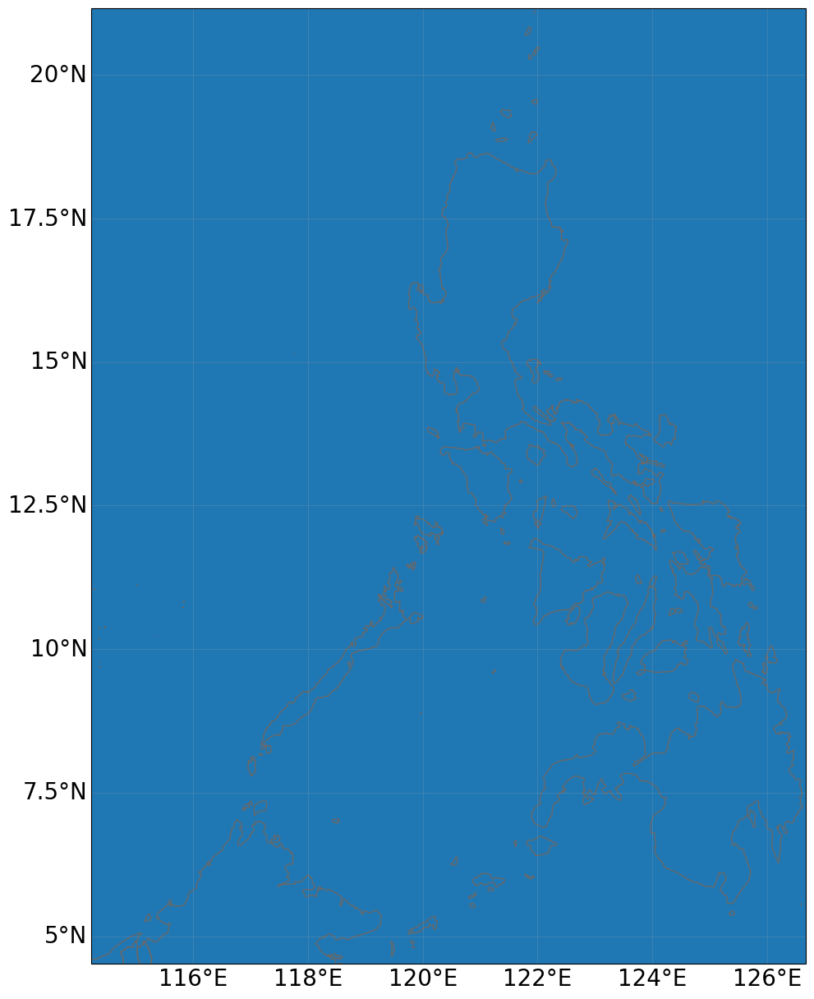

In [6]:
file_name = "IBF_typhoon_model\\data\\wind_data\\input\\phl_admin3_simpl2.geojson"
path = os.path.join(cdir, file_name)
admin=gpd.read_file(path)

minx, miny, maxx, maxy = admin.total_bounds

print(minx, miny, maxx, maxy)

# minx = 123
# maxx = 125
# miny = 7
# maxy = 8

cent = Centroids()
# cent.set_raster_from_pnt_bounds((minx,miny,maxx,maxy), res=0.05)
cent.set_raster_from_pnt_bounds((minx,miny,maxx,maxy), res=0.05)
cent.check()
cent.plot()
plt.show()
plt.close()

#TODO set the bounds to the bounds of the shape file of the Philippines
#TODO this needs to be changed in the pipeline to obtain complete information
# cent = Centroids()
# cent.set_raster_from_pnt_bounds((118,6,127,19), res=0.05)
# cent.check()
# cent.plot()

In [7]:
df = pd.DataFrame(data=cent.coord)
df["centroid_id"] = "id"+(df.index).astype(str)  
centroid_idx=df["centroid_id"].values
ncents = cent.size
df=df.rename(columns={0: "lat", 1: "lon"})
#calculate wind field for each ensamble members 
# Instead of one grid point for each municipalities: uses a range of gridpoints and calculates value for each point
# Eventually select a specific point in municipality based on condition

In [8]:
def adjust_tracks(forcast_df):
    track = xr.Dataset(
        data_vars={
            'max_sustained_wind': ('time', 0.514444*forcast_df.max_sustained_wind.values),
            'environmental_pressure': ('time', forcast_df.environmental_pressure.values),
            'central_pressure': ('time',forcast_df.central_pressure.values),
            'lat': ('time',forcast_df.lat.values),
            'lon': ('time', forcast_df.lon.values),
            'radius_max_wind':('time', forcast_df.radius_max_wind.values),  
            'radius_oci':('time',forcast_df.radius_oci.values), 
            'time_step':('time',np.full_like(forcast_df.time_step.values, 3, dtype=float)),
        },
        coords={
            'time': forcast_df.time.values,
        },
        attrs={
            'max_sustained_wind_unit': 'm/s',
            'central_pressure_unit': 'mb',
            'name': forcast_df.name,
            'sid': forcast_df.sid,#+str(forcast_df.ensemble_number),
            'orig_event_flag': forcast_df.orig_event_flag,
            'data_provider': forcast_df.data_provider,
            'id_no': forcast_df.id_no,
            'basin': forcast_df.basin,
            'category': forcast_df.category,
        }
    )
    track = track.set_coords(['lat', 'lon'])
    return track

In [9]:
tracks=TCTracks()
tracks.data=[adjust_tracks(tr) for tr in  Typhoons.data]

In [10]:
# Shows specific data for one of the typhoons
tracks.data[0]

<xarray.Dataset>
Dimensions:                 (time: 39)
Coordinates:
    lat                     (time) float32 14.3 14.13 14.2 ... 15.1 14.95 14.8
    lon                     (time) float32 128.8 128.1 127.4 ... 107.9 107.8
  * time                    (time) datetime64[ns] 2009-09-25 ... 2009-09-29T1...
Data variables:
    max_sustained_wind      (time) float32 7.717 8.746 10.29 ... 18.01 10.29
    environmental_pressure  (time) float64 1.01e+03 1.008e+03 ... 1.008e+03
    central_pressure        (time) float32 1.01e+03 1.008e+03 ... 1.007e+03
    radius_max_wind         (time) float32 0.0 0.0 0.0 0.0 ... 15.0 0.0 0.0 0.0
    radius_oci              (time) float32 0.0 0.0 0.0 0.0 ... 232.0 0.0 0.0 0.0
    time_step               (time) float64 3.0 3.0 3.0 3.0 ... 3.0 3.0 3.0 3.0
Attributes:
    max_sustained_wind_unit:  m/s
    central_pressure_unit:    mb
    name:                     KETSANA
    sid:                      2009268N14128
    orig_event_flag:          True
    data_provider:            ibtracs_usa
    id_no:                    2009268014128.0
    basin:                    <xarray.DataArray 'basin' (time: 39)>\narray(['...
    category:                 2

In [11]:
# tracks1=TCTracks()
# tracks1.data=tracks.data[0]
# TYphoon = TropCyclone()
# TYphoon.set_from_tracks(tracks1, cent, store_windfields=True)

tracks.equal_timestep(0.5)

# define a new typhoon class
TYphoon = TropCyclone()
TYphoon.set_from_tracks(tracks, cent, store_windfields=True)

C:\Users\Marieke\anaconda3\envs\Rice_Field_Damage_Philippines\lib\site-packages\xarray\core\common.py:1123: UserWarning: Passing ``keep_attrs`` to ``resample`` has no effect and will raise an error in xarray 0.20. Pass ``keep_attrs`` directly to the applied function, e.g. ``resample(...).mean(keep_attrs=True)``.
  "Passing ``keep_attrs`` to ``resample`` has no effect and will raise an"
C:\Users\Marieke\anaconda3\envs\Rice_Field_Damage_Philippines\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
C:\Users\Marieke\anaconda3\envs\Rice_Field_Damage_Philippines\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the pr

In [12]:
# plot intensity for one of the ensambles
# TYphoon.plot_intensity(event=Typhoons.data[0].sid)
# plt.show()
# plt.close()

In [13]:
df = pd.DataFrame(data=cent.coord)
df["centroid_id"] = "id"+(df.index).astype(str)  
centroid_idx=df["centroid_id"].values
ncents = cent.size
df=df.rename(columns={0: "lat", 1: "lon"})
#TODO what does this threshold hold do and why is it set to this value?
#TODO set threshold value to 0 to delete all entirely irrelevant observation
threshold=10
threshold = 0.1 
#calculate wind field for each ensamble members 

list_intensity=[]
distan_track=[]


for tr in tracks.data:
  print(tr.name)

  track = TCTracks() 
  typhoon = TropCyclone()
  track.data=[tr]
  typhoon.set_from_tracks(track, cent, store_windfields=True)
  windfield=typhoon.windfields
  nsteps = windfield[0].shape[0]
  centroid_id = np.tile(centroid_idx, nsteps)
  intensity_3d = windfield[0].toarray().reshape(nsteps, ncents, 2)
  intensity = np.linalg.norm(intensity_3d, axis=-1).ravel()

  timesteps = np.repeat(tr.time.values, ncents)
  timesteps = timesteps.reshape((nsteps, ncents)).ravel()
  inten_tr = pd.DataFrame({
      'centroid_id': centroid_id,
      'value': intensity,
      'timestamp': timesteps,
  })


  inten_tr = inten_tr[inten_tr.value > threshold]
  
  inten_tr['storm_id'] = tr.sid
  list_intensity.append(inten_tr)
  distan_track1=[]
  for index, row in df.iterrows():
      dist=np.min(np.sqrt(np.square(tr.lat.values-row['lat'])+np.square(tr.lon.values-row['lon'])))
      distan_track1.append(dist*111)
  dist_tr = pd.DataFrame({'centroid_id': centroid_idx,'value': distan_track1})
  dist_tr['storm_id'] = tr.sid
  distan_track.append(dist_tr)      
 

KETSANA


In [14]:
df.shape

(82336, 3)

In [15]:

#? Changed document source, geojson instead of shape
file_name = "IBF_typhoon_model\\data\\wind_data\\input\\phl_admin3_simpl2.geojson"
path = os.path.join(cdir, file_name)
admin=gpd.read_file(path)



df_ = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))
#df.to_crs({'init': 'epsg:4326'})
df_.crs = {'init': 'epsg:4326'}
df_ = df_.to_crs("EPSG:4326")
df_admin = sjoin(df_, admin, how="left")
#TODO why is this added? --> commented out
#To remove points that are in water
df_admin=df_admin.dropna()

In [16]:
display(df_.head())
display(admin.head())
display(df_admin.head())
# df_new = df_.to_crs("EPSG:4326")
# df_new.crs

,lat,lon,centroid_id,geometry
0,21.121808,114.277902,id0,POINT (114.27790 21.12181)
1,21.121808,114.327902,id1,POINT (114.32790 21.12181)
2,21.121808,114.377902,id2,POINT (114.37790 21.12181)
3,21.121808,114.427902,id3,POINT (114.42790 21.12181)
4,21.121808,114.477902,id4,POINT (114.47790 21.12181)


,adm3_en,adm3_pcode,adm2_pcode,adm1_pcode,glat,glon,geometry
0,Adams,PH012801000,PH012800000,PH010000000,18.453,120.919,"MULTIPOLYGON (((120.94626 18.51158, 120.96915 ..."
1,Bacarra,PH012802000,PH012800000,PH010000000,18.267,120.613,"MULTIPOLYGON (((120.59081 18.29526, 120.59192 ..."
2,Badoc,PH012803000,PH012800000,PH010000000,17.906,120.509,"MULTIPOLYGON (((120.47783 17.97744, 120.47814 ..."
3,Bangui,PH012804000,PH012800000,PH010000000,18.490,120.750,"MULTIPOLYGON (((120.79393 18.53475, 120.79537 ..."
4,City of Batac,PH012805000,PH012800000,PH010000000,18.038,120.584,"MULTIPOLYGON (((120.56070 18.12259, 120.56127 ..."


,lat,lon,centroid_id,geometry,index_right,adm3_en,adm3_pcode,adm2_pcode,adm1_pcode,glat,glon
1640,20.821808,121.877902,id1640,POINT (121.87790 20.82181),207.0,Itbayat,PH020902000,PH020900000,PH020000000,20.769,121.841
1887,20.771808,121.827902,id1887,POINT (121.82790 20.77181),207.0,Itbayat,PH020902000,PH020900000,PH020000000,20.769,121.841
2135,20.721808,121.827902,id2135,POINT (121.82790 20.72181),207.0,Itbayat,PH020902000,PH020900000,PH020000000,20.769,121.841
3378,20.471808,121.977902,id3378,POINT (121.97790 20.47181),206.0,Basco,PH020901000,PH020900000,PH020000000,20.459,121.993
3379,20.471808,122.027902,id3379,POINT (122.02790 20.47181),206.0,Basco,PH020901000,PH020900000,PH020000000,20.459,121.993


In [17]:
# # Some municipalities are missing in the dataframe
# # Obtain a dictionary with their codes and the code of the nearest municipalities for which data is available
# mun_missing = admin[admin['adm3_pcode'].isin(df_admin['adm3_pcode']) == False]
# mun_missing_points = gpd.GeoDataFrame(mun_missing, geometry=gpd.points_from_xy(mun_missing.glon, mun_missing.glat))
# pts3 = df_admin.geometry.unary_union

# def near(point, pts=pts3):
#      # find the nearest point and return the corresponding Place value
#      nearest = df_admin.geometry == nearest_points(point, pts)[1]
#      # display(df_admin[nearest].centroid_id.values[0])
#      return df_admin[nearest].adm3_pcode.values[0]

# mun_missing_points['neighbor_mun_code'] = mun_missing_points.apply(lambda row: near(row.geometry), axis=1)

# dict_nearest = dict(zip(mun_missing_points['adm3_pcode'], mun_missing_points['neighbor_mun_code']))

# Some municipalities are missing in the dataframe
# Obtain a dictionary with their codes and the code of the nearest municipalities for which data is available
mun_missing = admin[admin['adm3_pcode'].isin(df_admin['adm3_pcode']) == False]
print(f"There are {len(mun_missing)} missing municipalities")

mun_missing_points = gpd.GeoDataFrame(mun_missing, geometry=gpd.points_from_xy(mun_missing.glon, mun_missing.glat))
pts3 = df_admin.geometry.unary_union

def near(point, pts=pts3):
     # find the nearest point and return the corresponding Place value
     nearest = df_admin.geometry == nearest_points(point, pts)[1]
     # display(df_admin[nearest].centroid_id.values[0])
     return df_admin[nearest].centroid_id.values[0]

mun_missing_points['centroid_id'] = mun_missing_points.apply(lambda row: near(row.geometry), axis=1)

# dict_nearest = dict(zip(mun_missing_points['adm3_pcode'], mun_missing_points['neighbor_mun_code']))

#TODO change to centroid_id

There are 87 missing municipalities


In [18]:
def match_values_lat(x):

    return df_admin['lat'][df_admin['centroid_id']==x].values[0]

def match_values_lon(x):

    return df_admin['lon'][df_admin['centroid_id']==x].values[0]


def match_values_geo(x):

    return df_admin['geometry'][df_admin['centroid_id']==x].values[0]


mun_missing_points['lat'] = mun_missing_points['centroid_id'].apply(match_values_lat)
mun_missing_points['lon'] = mun_missing_points['centroid_id'].apply(match_values_lon)
mun_missing_points['geometry'] = mun_missing_points['centroid_id'].apply(match_values_geo)

# mun_missing_points['lat'], mun_missing_points['long'], mun_missing_points['geometry'] = mun_missing_points['centroid_id'].apply(match_values)

df_admin = df_admin[['adm3_en', 'adm3_pcode', 'adm2_pcode', 'adm1_pcode', 'glat', 'glon', 'lat', 'lon', 'centroid_id']]

mun_missing_points = mun_missing_points[['adm3_en', 'adm3_pcode', 'adm2_pcode', 'adm1_pcode', 'glat', 'glon', 'lat', 'lon', 'centroid_id']]

df_admin = pd.concat([df_admin, mun_missing_points])

mun_missing = admin[admin['adm3_pcode'].isin(df_admin['adm3_pcode']) == False]
print(f"There are {len(mun_missing)} missing municipalities")

There are 0 missing municipalities


In [19]:
df_intensity = pd.concat(list_intensity)
df_intensity=pd.merge(df_intensity, df_admin, how='outer', on='centroid_id')


In [20]:
df_intensity.head()

,centroid_id,value,timestamp,storm_id,adm3_en,adm3_pcode,adm2_pcode,adm1_pcode,glat,glon,lat,lon
0,id14382,1.259863,2009-09-25 00:30:00,2009268N14128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,id14382,1.256012,2009-09-25 01:00:00,2009268N14128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,id14382,1.250670,2009-09-25 01:30:00,2009268N14128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,id14382,1.244913,2009-09-25 02:00:00,2009268N14128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,id14382,1.240211,2009-09-25 02:30:00,2009268N14128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df_intensity.shape
df_intensity[df_intensity['lat'].notnull()].head()

,centroid_id,value,timestamp,storm_id,adm3_en,adm3_pcode,adm2_pcode,adm1_pcode,glat,glon,lat,lon
198763,id35414,1.294683,2009-09-25 00:30:00,2009268N14128,Pandan,PH052006000,PH052000000,PH050000000,14.031,124.196,14.021808,124.177902
198764,id35414,1.318765,2009-09-25 01:00:00,2009268N14128,Pandan,PH052006000,PH052000000,PH050000000,14.031,124.196,14.021808,124.177902
198765,id35414,1.342778,2009-09-25 01:30:00,2009268N14128,Pandan,PH052006000,PH052000000,PH050000000,14.031,124.196,14.021808,124.177902
198766,id35414,1.367633,2009-09-25 02:00:00,2009268N14128,Pandan,PH052006000,PH052000000,PH050000000,14.031,124.196,14.021808,124.177902
198767,id35414,1.394786,2009-09-25 02:30:00,2009268N14128,Pandan,PH052006000,PH052000000,PH050000000,14.031,124.196,14.021808,124.177902


In [22]:
df_intensity = pd.concat(list_intensity)
df_intensity=pd.merge(df_intensity, df_admin, how='outer', on='centroid_id')
#df_intensity = gpd.GeoDataFrame(df_intensity, geometry=gpd.points_from_xy(df_intensity.lon, df_intensity.lat))
df_intensity=df_intensity.dropna()
#df_intensity = gpd.GeoDataFrame(df_intensity, geometry=gpd.points_from_xy(df_intensity.lon, df_intensity.lat))
#? Only keeps observations with an intensity higher than 12 --> why --> why not cancel out at the end when preparing the data so it is easier to adjust
#? Obtains the maximum intensity for each municipality and storm_id combination & also return the count (how often the combination occurs in the set)
#TODO changed to not filtering based on intensity
# df_intensity=df_intensity[df_intensity['value'].gt(12)].groupby(['adm3_pcode','storm_id'],as_index=False).agg({"value":['count', 'max']}) 
df_intensity=df_intensity[df_intensity['value'].gt(0)].groupby(['adm3_pcode','storm_id'],as_index=False).agg({"value":['count', 'max']}) 
# rename columns
df_intensity.columns = [x for x in ['adm3_pcode','storm_id','value_count','v_max']]
#########################################################################################
df_track = pd.concat(distan_track)
df_track=pd.merge(df_track, df_admin, how='outer', on='centroid_id')
df_track=df_track.dropna()
#? Obtains the minimum track distance for each municipality and storm_id combination
df_track_=df_track.groupby(['adm3_pcode','storm_id'],as_index=False).agg({'value':'min'}) 
df_track_.columns = [x for x in ['adm3_pcode','storm_id','dis_track_min']]#join_left_df_.columns.ravel()]
typhhon_df = pd.merge(df_intensity, df_track_,  how='left', on=['adm3_pcode','storm_id']) 
#typhhon_df.to_csv(os.path.join('/dbfs/mnt/TyphoonData/typhoon/Bronze/TyphoonModel/Typhoon-Impact-based-forecasting-model/past_typhoon_windfields/historical_typhoons_intensity.csv')

In [23]:
# Check if there are duplicates for municipality and storm_id
duplicate = typhhon_df[typhhon_df.duplicated(subset=['adm3_pcode', 'storm_id'], keep=False)]
duplicate.head()

# No duplicates: final dataframe contains vmax and dis_track_min fpr each storm and municipality

,adm3_pcode,storm_id,value_count,v_max,dis_track_min


In [24]:
typhhon_df.head()
np.min(typhhon_df['v_max'])
np.max(typhhon_df['dis_track_min'])

502.199265459956

In [25]:
# Add the changes that are related to the wind variables and present in the R script
typhhon_df['vmax_gust'] = typhhon_df['v_max'] *1.21*1.9*1.94384 #knot(1.94384) and 1.21 is conversion factor for 10 min average to 1min average
typhhon_df['vmax_gust_mph'] = typhhon_df['v_max'] *1.21*1.9*2.23694 #mph 1.9 is factor to drive gust and sustained wind 
typhhon_df['vmax_sust_mph'] = typhhon_df['v_max'] *1.21*2.23694
typhhon_df['vmax_sust'] = typhhon_df['v_max'] *1.21*1.94384


In [26]:
file_name = 'IBF_typhoon_model\\data\\wind_data\\output\\historical_typhoons_wind_test.csv'
path = os.path.join(cdir, file_name)

typhhon_df.to_csv(path)